# Practical Deep Learning Workshop 2021
## Assignment 4 - Super Resolution
 
### Author: Naor Kolet 205533060

# Imports

In [172]:
import glob
import cv2
import matplotlib.pyplot as plt
import seaborn as sns

from tensorflow.keras.layers import Input, Conv2D, UpSampling2D
from tensorflow.keras.layers import Activation, LeakyReLU, Add, Concatenate

from tensorflow.keras.applications import VGG16

from tensorflow.nn import depth_to_space

from tensorflow.keras.models import Model, load_model

from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, Callback
import tensorflow as tf



from tqdm import tqdm_notebook as tqdm

import numpy as np
import pandas as pd
import os
import joblib

In [2]:
path = 'VOCdevkit/VOC2007/JPEGImages/'

# Step 1 - Data preparation

Here I will seperate the data into three datasets according to the following ranges.

Note: Here i also scale the images to range of [0,1]

In [3]:
TRAIN_RANGE = (0,4000)
VALIDATION_RANGE = (4000,5000)
TEST_RANGE = (5000, 5012)

In [4]:
def prepare_dataset(start_ind, end_ind):
    filelist = glob.glob(path+'*.jpg')
    X = []
    y_mid = []
    y_large = []

    for f in tqdm(filelist[start_ind:end_ind]):
        img = cv2.imread(f)/255.
        X.append(cv2.resize(img,(72,72)))
        y_mid.append(cv2.resize(img,(144,144)))
        y_large.append(cv2.resize(img,(288,288)))
    
    return {'X': np.array(X), 'y_mid': np.array(y_mid), 'y_large': np.array(y_large)}

In [5]:
train = prepare_dataset(*TRAIN_RANGE)
val = prepare_dataset(*VALIDATION_RANGE)
test = prepare_dataset(*TEST_RANGE)

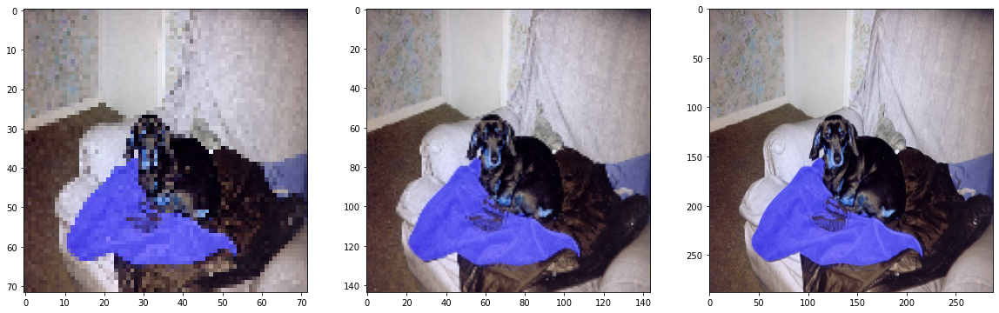

In [6]:
def plot_multiple_images(ind, X, y_mid, y_large):
    fig, ax = plt.subplots(1, 3, figsize=(20,6))
    ax[0].imshow(X[ind])
    ax[1].imshow(y_mid[ind])
    ax[2].imshow(y_large[ind])
    
plot_multiple_images(42, train['X'], train['y_mid'], train['y_large'])

### Training infrastructure

I've set some callbacks to optimize my training, using Earlystop with min_delta of 0.0001 instead of the default 0 were able to make sure not running useless episodes (there were epochs that improved the val_loss by less than 0.0001)

In [7]:
def get_callbacks(model_name):
    checkpoint = ModelCheckpoint(
        fr'./models/{model_name}.h5',
        monitor='val_loss', 
        save_best_only=True, 
        mode='min')
    earlystop = EarlyStopping(
        monitor='val_loss', 
        mode='min', 
        min_delta = 0.0001,
        verbose=1, 
        patience=4)
    reduceLR = ReduceLROnPlateau(
        monitor = 'val_loss', 
        mode = 'min', 
        min_delta = 0.0001,
        patience = 3,
        factor = 0.5, 
        min_lr = 1e-6, 
        verbose = 1)

    return [checkpoint, reduceLR, earlystop]

In [8]:
def visualize_perf(history, dual_output=True):
    ncol = 3 if dual_output else 1
    fig, ax = plt.subplots(nrows=1, ncols=ncol, figsize=(5*ncol,5), sharey=True)
    fig.suptitle(f'Model performance over epochs')
    
    ax = ax if dual_output else [ax]
    
    for k in ['loss', 'val_loss']:
        ax[0].plot(history[k])
        ax[0].set_title('loss')
        
    if dual_output:
        for i, k in enumerate(['out_mid_loss', 'out_large_loss']):
            ax[i+1].plot(history[k])
            ax[i+1].plot(history['val_'+k])
            ax[i+1].set_title(k)
    
    for axi in ax:
        axi.legend(['train_loss', 'val_loss'])
        axi.margins(0.01)
        axi.set_yscale('log')
    
    plt.show()


In [9]:
def train_model(model_gen, dual_output=True, batch_size=64, custom_callback=None, use_saved=False):
    os.makedirs('./models', exist_ok=True)
    model_name = model_gen.__name__[5:]
    
        
    if use_saved:
        history = joblib.load(fr'./models/{model_name}_history.sav')
    else:
        callbacks = get_callbacks(model_name)
        if custom_callback:
            callbacks += [custom_callback]
        
        
        history = model_gen(train['X'].shape[1:]).fit(
                    x=train['X'],
                    y=[train['y_mid'], train['y_large']] if dual_output else train['y_mid'],
                    batch_size=batch_size,
                    epochs=50,
                    validation_data=(val['X'], 
                                     [val['y_mid'], val['y_large']] if dual_output else val['y_mid']),
                    callbacks=callbacks
                    )
        
        history = history.history
        joblib.dump(history, fr'./models/{model_name}_history.sav')
    
    model = load_model(fr'./models/{model_name}.h5', custom_objects={'LeakyReLU': LeakyReLU})

    
    return model, history

# Step 2 - Creating an initial model

Here I will implement my first super resolution model. 

I will try two diffrent Up Sampling methods: Nearest and Bilinear

### Model v1 - Nearest UpSampling

In [11]:
def init_model_v1(input_shape):

    inp = Input(input_shape)
    X = Conv2D(64,3,activation='relu', padding='same')(inp)
    X = Conv2D(64,3,activation='relu', padding='same')(X)
    X = UpSampling2D(2, interpolation='nearest')(X)
    out = Conv2D(3,1,activation='sigmoid', padding='same')(X)

    model = Model(inp, outputs=out)

    model.compile(optimizer='adam', loss='mse')

    return model

In [12]:
model_v1 = init_model_v1(train['X'].shape[1:])
model_v1.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 72, 72, 3)]       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 72, 72, 64)        1792      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 72, 72, 64)        36928     
_________________________________________________________________
up_sampling2d (UpSampling2D) (None, 144, 144, 64)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 144, 144, 3)       195       
Total params: 38,915
Trainable params: 38,915
Non-trainable params: 0
_________________________________________________________________


In [13]:
model_v1, history_v1 = train_model(init_model_v1, dual_output=False, use_saved=True)

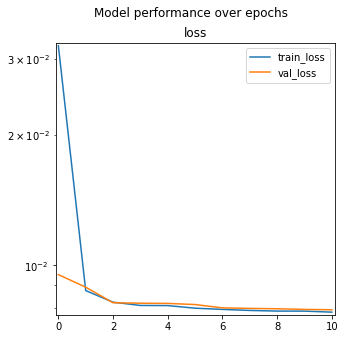

In [14]:
visualize_perf(history_v1, dual_output=False)

Now I will show an example of the prediction in the test dataset

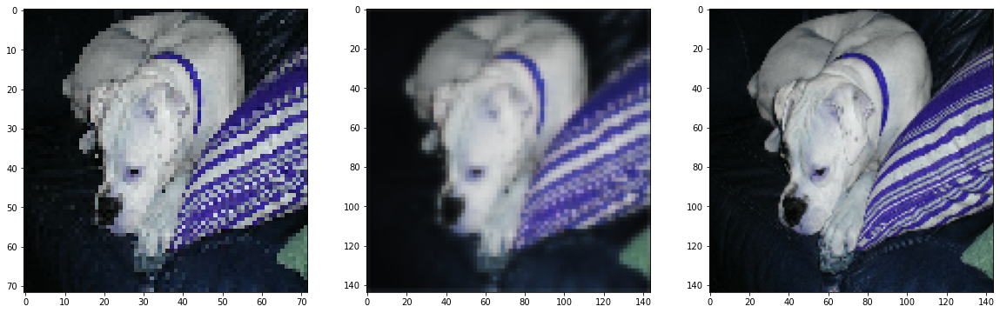

In [16]:
preds_v1 = model_v1.predict(test['X'])
plot_multiple_images(10, test['X'], preds_v1, test['y_mid'])

As can be seen, using 'nearest' interpolation make the image very \`pixelated\`

## Model v2 - Bilinear UpSampling

In [17]:
def init_model_v2(input_shape):

    inp = Input(input_shape)
    X = Conv2D(64,3,activation='relu', padding='same')(inp)
    X = Conv2D(64,3,activation='relu', padding='same')(X)
    X = UpSampling2D(2, interpolation='bilinear')(X)
    out = Conv2D(3,1,activation='sigmoid', padding='same')(X)

    model = Model(inp, outputs=out)

    model.compile(optimizer='adam', loss='mse')

    return model

In [18]:
model_v2, history_v2 = train_model(init_model_v2, dual_output=False, use_saved=True)

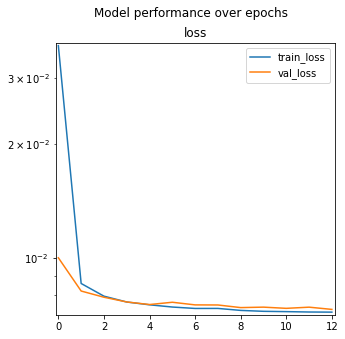

In [19]:
visualize_perf(history_v2, dual_output=False)

Now I will show an example of the prediction in the test dataset

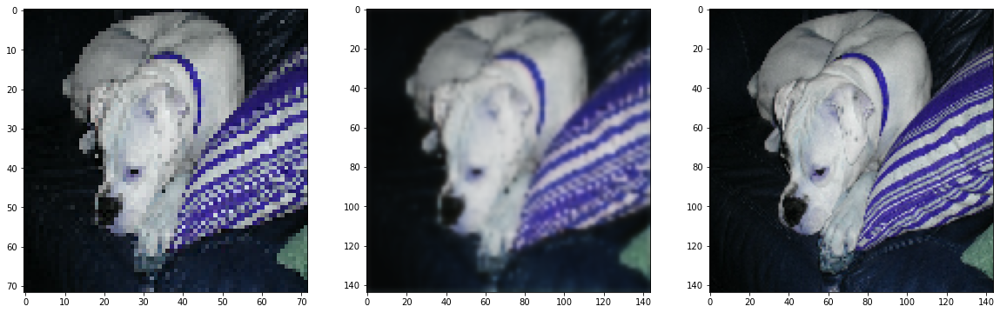

In [20]:
preds_v2 = model_v2.predict(test['X'])
plot_multiple_images(10, test['X'], preds_v2, test['y_mid'])

As can be seen above, the image is more smooth when using \`bilinear\` 
interpolation. I will stick with it because it more realistic

# Step 3

### Model v3 - Extracting two levels of super resolution

Here I will another UpSampling layer to be able to produce two levels of resolution

In [21]:
def init_model_v3(input_shape):

    inp = Input(input_shape)
    X = Conv2D(64,3,activation='relu', padding='same')(inp)
    X = Conv2D(64,3,activation='relu', padding='same')(X)
    X = UpSampling2D(2, interpolation='bilinear')(X)
    out1 = Conv2D(3,1,activation='sigmoid', padding='same', name='out_mid')(X)
    X = UpSampling2D(2, interpolation='bilinear')(X)
    out2 = Conv2D(3,1,activation='sigmoid', padding='same', name='out_large')(X)

    model = Model(inp, outputs=[out1, out2])

    model.compile(optimizer='adam', loss='mse')

    return model

In [22]:
model_v3 = init_model_v3(train['X'].shape[1:])
model_v3.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 72, 72, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_3 (Conv2D)               (None, 72, 72, 64)   1792        input_2[0][0]                    
__________________________________________________________________________________________________
conv2d_4 (Conv2D)               (None, 72, 72, 64)   36928       conv2d_3[0][0]                   
__________________________________________________________________________________________________
up_sampling2d_1 (UpSampling2D)  (None, 144, 144, 64) 0           conv2d_4[0][0]                   
____________________________________________________________________________________________

In [23]:
model_v3, history_v3 = train_model(init_model_v3, use_saved=True)

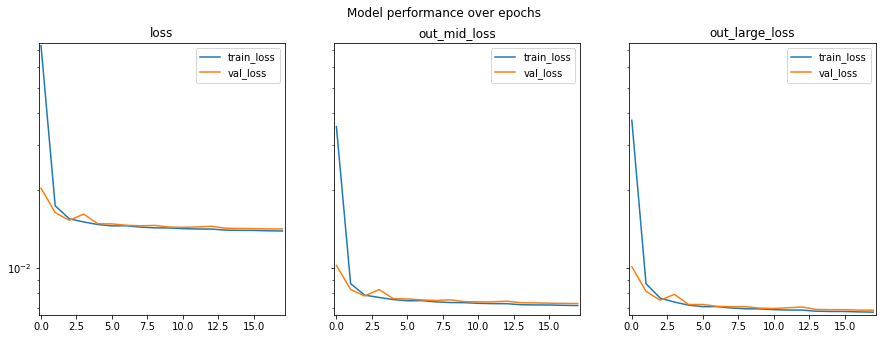

In [24]:
visualize_perf(history_v3)

Now I will show an example of the prediction in the test dataset

Note: The first row is the ground truth, the second row is the input in the left and the two stages of the output from.

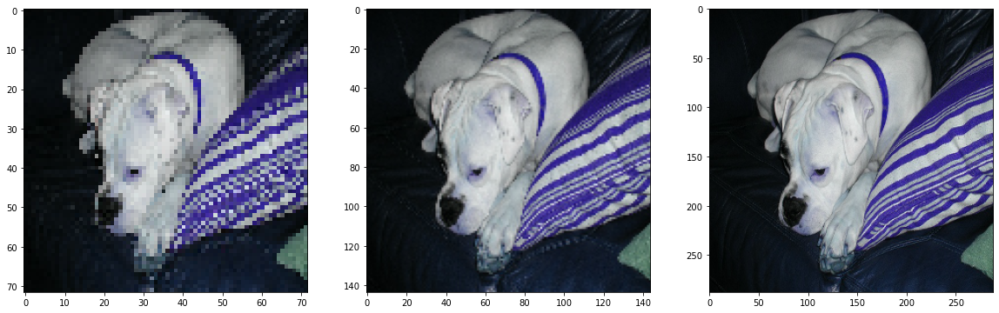

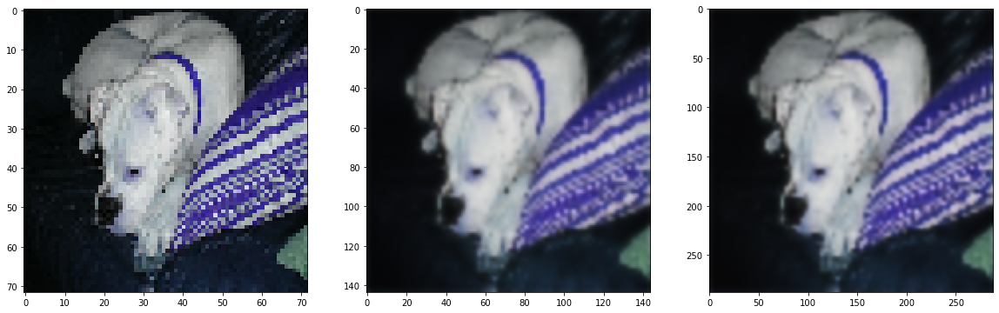

In [26]:
preds_v3 = model_v3.predict(test['X'])
plot_multiple_images(10, test['X'], test['y_mid'], test['y_large'])
plot_multiple_images(10, test['X'], preds_v3[0], preds_v3[1])

In the prediction of the higher resolution we can start to see more details

# Step 4

## Model v4 - Residual block

Here I will use a residual blocks to create the identity function that may result to better convergence

In [27]:
rb = 0

def get_res_block(channel):
    global rb
    inp = Input((None, None, channel))
    X = Conv2D(channel,3,activation=LeakyReLU(alpha=0.2), padding='same')(inp)
    X = Conv2D(channel,3,activation=LeakyReLU(alpha=0.2), padding='same')(X)
    X = Add()([X, inp])
    X = Activation(LeakyReLU(alpha=0.2))(X)
    
    rb += 1
    
    return Model(inp, X, name=f'residual_block_{rb}')

In [28]:
get_res_block(32).summary()

Model: "residual_block_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv2d_5 (Conv2D)               (None, None, None, 3 9248        input_3[0][0]                    
__________________________________________________________________________________________________
conv2d_6 (Conv2D)               (None, None, None, 3 9248        conv2d_5[0][0]                   
__________________________________________________________________________________________________
add (Add)                       (None, None, None, 3 0           conv2d_6[0][0]                   
                                                                 input_3[0][0]     

In [29]:
def init_model_v4(input_shape):
    inp = Input(input_shape)
    X = Conv2D(32,1,activation=LeakyReLU(alpha=0.2))(inp)
    X = get_res_block(32)(X)
    X = get_res_block(32)(X)
    X = UpSampling2D(2, interpolation='bilinear')(X)
    out1 = Conv2D(3,1,activation='sigmoid', padding='same', name='out_mid')(X)
    X = get_res_block(32)(X)
    X = get_res_block(32)(X)
    X = UpSampling2D(2, interpolation='bilinear')(X)
    out2 = Conv2D(3,1,activation='sigmoid', padding='same', name='out_large')(X)

    model = Model(inp, outputs=[out1, out2])

    model.compile(optimizer='adam', loss='mse')

    return model

In [30]:
model_v4 = init_model_v4(train['X'].shape[1:])
model_v4.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 72, 72, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_7 (Conv2D)               (None, 72, 72, 32)   128         input_4[0][0]                    
__________________________________________________________________________________________________
residual_block_2 (Model)        multiple             18496       conv2d_7[0][0]                   
__________________________________________________________________________________________________
residual_block_3 (Model)        multiple             18496       residual_block_2[1][0]           
____________________________________________________________________________________________

In [31]:
model_v4, history_v4 = train_model(init_model_v4, use_saved=True)

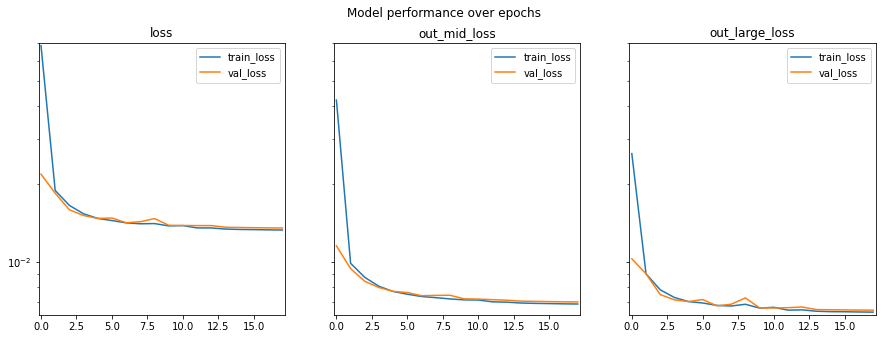

In [32]:
visualize_perf(history_v4)

Now I will show an example of the prediction in the test dataset

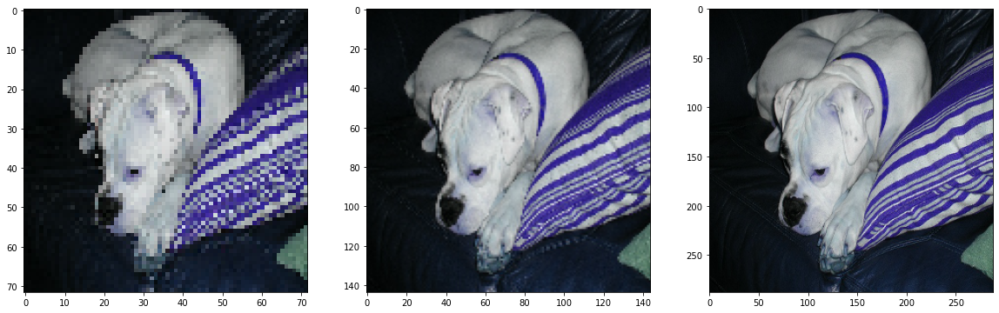

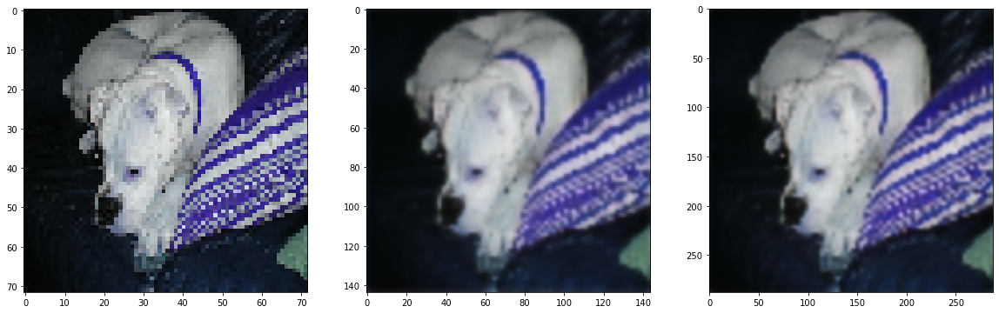

In [33]:
preds_v4 = model_v4.predict(test['X'])
plot_multiple_images(10, test['X'], test['y_mid'], test['y_large'])
plot_multiple_images(10, test['X'], preds_v4[0], preds_v4[1])

# Step 5

## Model v5 - Dilation Convolution

Here I will use dilation convolution in order to learn a more sparse pattern

In [41]:
db = 0
def get_dialted_block(channel):
    global db
    inp = Input((None, None, channel))
    d1 = Conv2D(channel,3, dilation_rate=1, activation=LeakyReLU(alpha=0.2), padding='same')(inp)
    d2 = Conv2D(channel,3, dilation_rate=2, activation=LeakyReLU(alpha=0.2), padding='same')(inp)
    d4 = Conv2D(channel,3, dilation_rate=4, activation=LeakyReLU(alpha=0.2), padding='same')(inp)
    X = Concatenate()([d1, d2, d4])
    X = Activation(LeakyReLU(alpha=0.2))(X)
    X = Conv2D(channel, 3, activation=LeakyReLU(alpha=0.2), padding='same')(X)
    
    db +=1
    
    return Model(inp, X, name=f'dialetd_block_{db}')

In [42]:
get_dialted_block(32).summary()

Model: "dialetd_block_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_15 (InputLayer)           [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv2d_37 (Conv2D)              (None, None, None, 3 9248        input_15[0][0]                   
__________________________________________________________________________________________________
conv2d_38 (Conv2D)              (None, None, None, 3 9248        input_15[0][0]                   
__________________________________________________________________________________________________
conv2d_39 (Conv2D)              (None, None, None, 3 9248        input_15[0][0]                   
____________________________________________________________________________________

In [43]:
def init_model_v5(input_shape):
    inp = Input(input_shape)
    X = Conv2D(32,1,activation=LeakyReLU(alpha=0.2))(inp)
    X = get_dialted_block(32)(X)
    X = get_dialted_block(32)(X)
    X = UpSampling2D(2, interpolation='bilinear')(X)
    out1 = Conv2D(3,1,activation='sigmoid', padding='same', name='out_mid')(X)
    X = get_dialted_block(32)(X)
    X = get_dialted_block(32)(X)
    X = UpSampling2D(2, interpolation='bilinear')(X)
    out2 = Conv2D(3,1,activation='sigmoid', padding='same', name='out_large')(X)

    model = Model(inp, outputs=[out1, out2])

    model.compile(optimizer='adam', loss='mse')

    return model

In [44]:
model_v5 = init_model_v5(train['X'].shape[1:])
model_v5.summary()

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_16 (InputLayer)           [(None, 72, 72, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_41 (Conv2D)              (None, 72, 72, 32)   128         input_16[0][0]                   
__________________________________________________________________________________________________
dialetd_block_2 (Model)         multiple             55424       conv2d_41[0][0]                  
__________________________________________________________________________________________________
dialetd_block_3 (Model)         multiple             55424       dialetd_block_2[1][0]            
____________________________________________________________________________________________

In [45]:
model_v5, history_v5 = train_model(init_model_v5, use_saved=True)

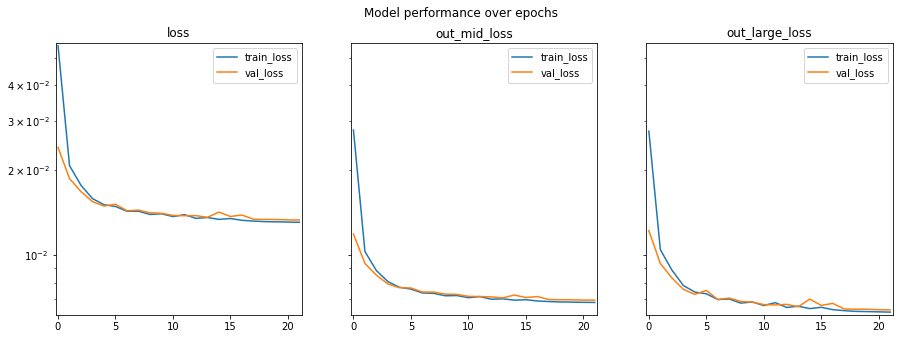

In [46]:
visualize_perf(history_v5)

Now I will show an example of the prediction in the test dataset

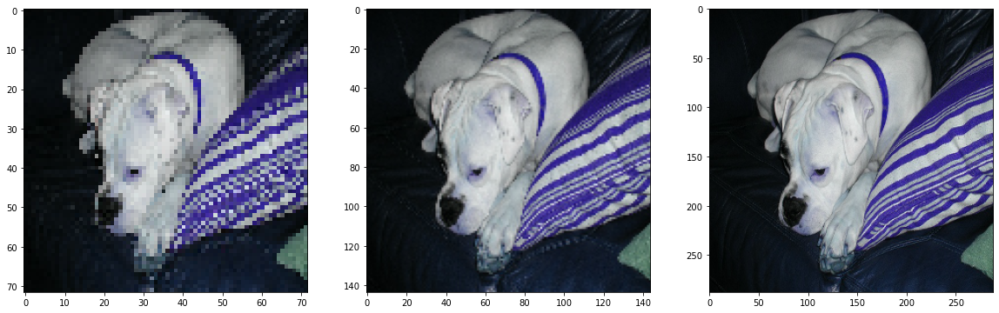

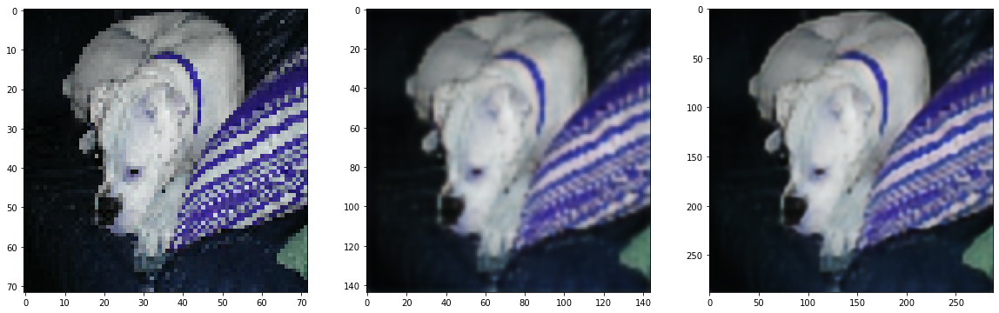

In [47]:
preds_v5 = model_v5.predict(test['X'])
plot_multiple_images(10, test['X'], test['y_mid'], test['y_large'])
plot_multiple_images(10, test['X'], preds_v5[0], preds_v5[1])

# Step 6

## Model v6 - Pretrained Network

Here I will use VGG16 pretrained weights in order to extract more features from the images that were usefull for imagenet

In [48]:
fe = 0

def get_feature_extractor_vgg16(channel):
    global fe
    inp = Input((None, None, channel))
    vgg = VGG16(input_tensor=inp, include_top=False)
    vgg_layers = vgg.layers[:3]
    for layer in vgg_layers:
        vgg.trainable = False
        
    fe += 1
    
    return Model(vgg_layers[0].input, vgg_layers[-1].output, name=f'vgg_fe_{fe}')

In [49]:
get_feature_extractor_vgg16(3).summary()

Model: "vgg_fe_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_21 (InputLayer)        [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
Total params: 38,720
Trainable params: 0
Non-trainable params: 38,720
_________________________________________________________________


In [50]:
def init_model_v6(input_shape):
    inp = Input(input_shape)
    
    X = Conv2D(64,3,activation=LeakyReLU(alpha=0.2), padding='same')(inp)
    X = Conv2D(64,3,activation=LeakyReLU(alpha=0.2), padding='same')(X)
    
    FE = get_feature_extractor_vgg16(input_shape[2])(inp)
    
    X = Concatenate()([X, FE])
    
    X = UpSampling2D(2, interpolation='bilinear')(X)
    
    out1 = Conv2D(3,1,activation='sigmoid', name='out_mid')(X)

    X = UpSampling2D(2, interpolation='bilinear')(X)
    out2 = Conv2D(3,1,activation='sigmoid', name='out_large')(X)

    model = Model(inp, outputs=[out1, out2])

    model.compile(optimizer='adam', loss='mse')

    return model

In [51]:
model_v6 = init_model_v6(train['X'].shape[1:])
model_v6.summary()

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_22 (InputLayer)           [(None, 72, 72, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_58 (Conv2D)              (None, 72, 72, 64)   1792        input_22[0][0]                   
__________________________________________________________________________________________________
conv2d_59 (Conv2D)              (None, 72, 72, 64)   36928       conv2d_58[0][0]                  
__________________________________________________________________________________________________
vgg_fe_2 (Model)                multiple             38720       input_22[0][0]                   
____________________________________________________________________________________________

In [52]:
model_v6, history_v6 = train_model(init_model_v6, batch_size=16, use_saved=True)

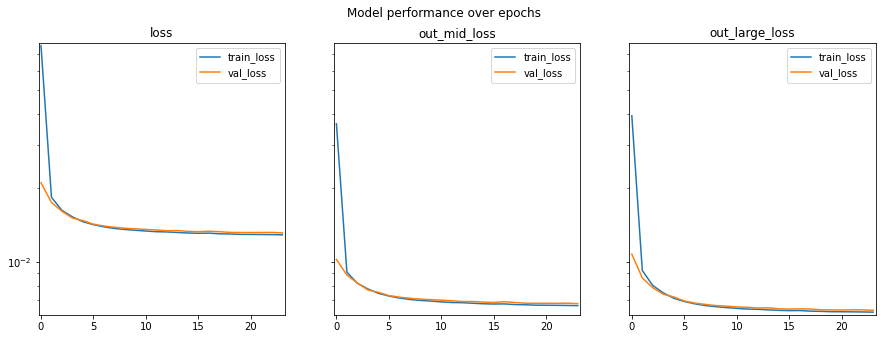

In [53]:
visualize_perf(history_v6)

Now I will show an example of the prediction in the test dataset

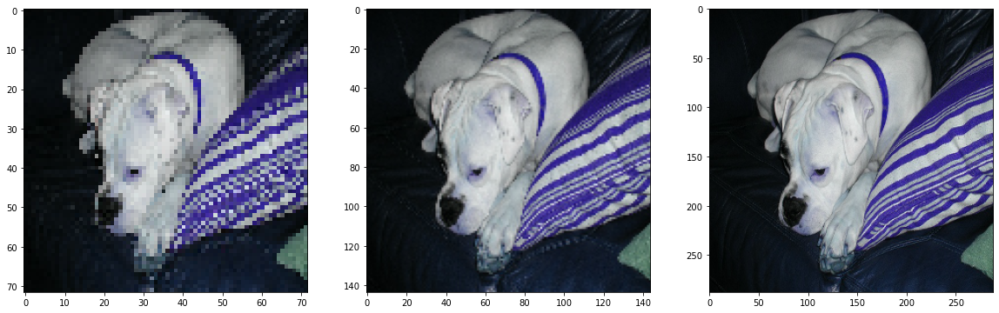

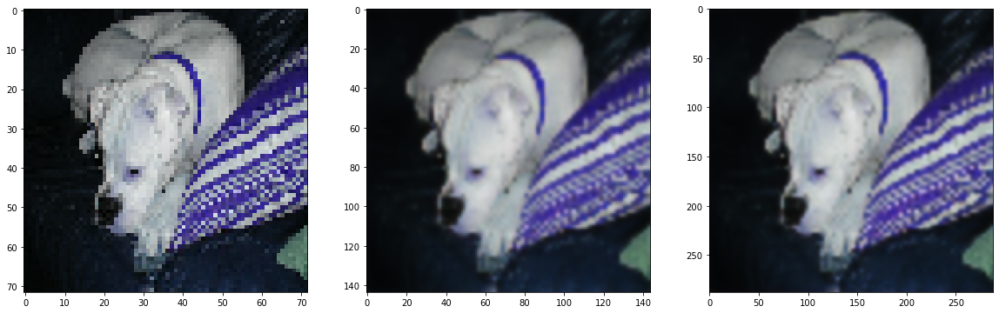

In [54]:
preds_v6 = model_v6.predict(test['X'])
plot_multiple_images(10, test['X'], test['y_mid'], test['y_large'])
plot_multiple_images(10, test['X'], preds_v6[0], preds_v6[1])

# Step 7

## Model v7 - Depth to Space

Here I will use another way to extand the resolution, I will use `Depth to Space` mechanism.

Here I needed to add a convolutional layer before each `Depth to Space` layer because the output had a strong matrix shown.

In [55]:
def init_model_v7(input_shape):
    inp = Input(input_shape)
    
    X = Conv2D(64,3,activation=LeakyReLU(alpha=0.2), padding='same')(inp)
    X = Conv2D(64,3,activation=LeakyReLU(alpha=0.2), padding='same')(X)
    
    FE = get_feature_extractor_vgg16(inp.shape[3])(inp)
    
    X = Concatenate()([X, FE])

    X = Conv2D(256,1,activation=LeakyReLU(alpha=0.2), padding='same')(X)
    X = depth_to_space(X, 2)
    
    out1 = Conv2D(3,1,activation='sigmoid', name='out_mid')(X)

    X = Conv2D(128,1,activation=LeakyReLU(alpha=0.2), padding='same')(X)
    X = depth_to_space(X, 2)
    out2 = Conv2D(3,1,activation='sigmoid', name='out_large')(X)

    model = Model(inp, outputs=[out1, out2])

    model.compile(optimizer='adam', loss='mse')

    return model

In [56]:
model_v7 = init_model_v7(train['X'].shape[1:])
model_v7.summary()

Model: "model_6"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_24 (InputLayer)           [(None, 72, 72, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_60 (Conv2D)              (None, 72, 72, 64)   1792        input_24[0][0]                   
__________________________________________________________________________________________________
conv2d_61 (Conv2D)              (None, 72, 72, 64)   36928       conv2d_60[0][0]                  
__________________________________________________________________________________________________
vgg_fe_3 (Model)                multiple             38720       input_24[0][0]                   
____________________________________________________________________________________________

In [57]:
model_v7, history_v7 = train_model(init_model_v7, batch_size=16, use_saved=True)

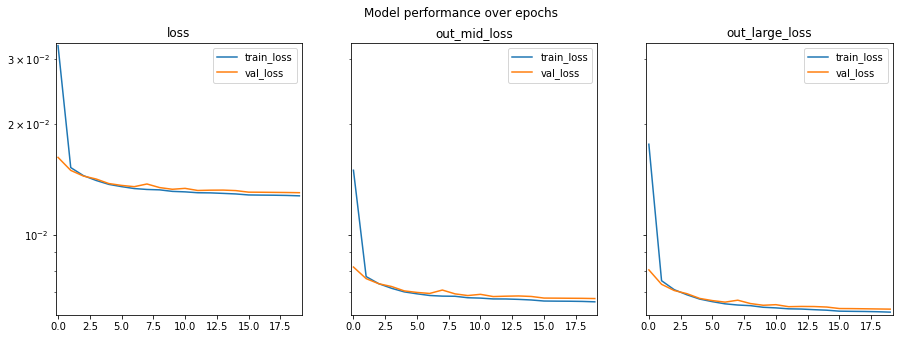

In [58]:
visualize_perf(history_v7)

Now I will show an example of the prediction in the test dataset

Before adding the layers

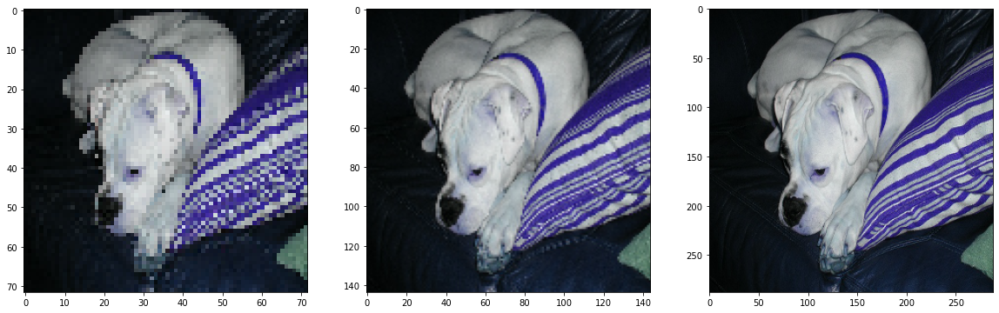

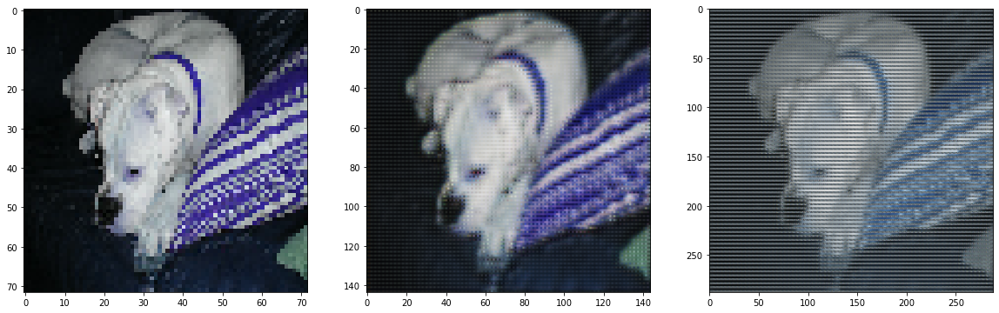

In [25]:
pred = model_v7.predict(test['X'])
plot_multiple_images(10, test['X'], test['y_mid'], test['y_large'])
plot_multiple_images(10, test['X'], pred[0], pred[1])

After adding the convolutional layers. The output is now smooth.

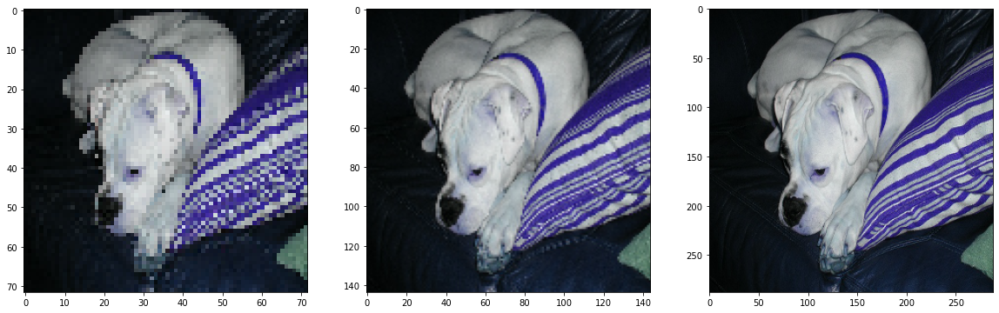

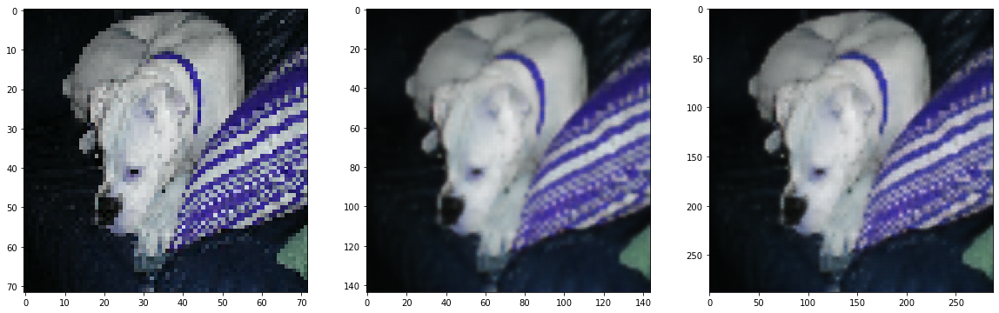

In [59]:
preds_v7 = model_v7.predict(test['X'])
plot_multiple_images(10, test['X'], test['y_mid'], test['y_large'])
plot_multiple_images(10, test['X'], preds_v7[0], preds_v7[1])

# Step 8

## Creating custom callbacks

Here I will use a custom callback in order to evaluate the test data for each epoch and creating a GIF

In [60]:
class SaveProgress(Callback):
    
    
    def __init__(self):
        self.preds_container = []
        
    def on_epoch_begin(self, epoch, logs=None):
        if not epoch:
            self.preds_container += [self.model.predict(test['X'])]
    
    def on_epoch_end(self, epoch, logs=None):
        self.preds_container += [self.model.predict(test['X'])]

In [ ]:
save_progress_cb_7 = SaveProgress()
model_v7, history_v7 = train_model(init_model_v7, custom_callback=save_progress_cb_7, batch_size=16, use_saved=False)

In [61]:
from matplotlib import animation, rc
rc('animation', html='html5')

def create_animation(preds, pic_ind, stage=2):
    fig, ax = plt.subplots()

    frames = len(preds)
    def init():
        ax_image = ax.imshow(preds[0][stage-1][pic_ind])
        ax.set_xlabel(f'Epoch 0')
        return (ax_image,)

    def animate(i):
        ax_image = ax.imshow(preds[i][stage-1][pic_ind])
        label = f'Epoch {i}'
        ax.set_xlabel(label)
        return (ax_image,)

    anim = animation.FuncAnimation(fig, animate, init_func=init,
                                   frames=frames, interval=300, blit=True)
    return anim

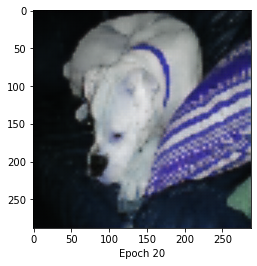

In [110]:
anim = create_animation(save_progress_cb_7.preds_container, 10)
anim

As can be seen from the video, the network very quickly manage to drastically lower the loss on the first epoch, this is due to the large number of images in the training dataset. When I extracted that video with only 200 images it was slowly transformed from the grey noise to the image, as show below

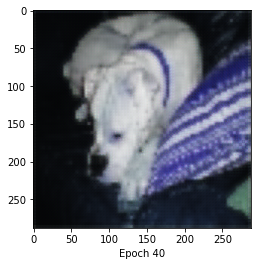

In [120]:
anim = create_animation(save_progress_cb_7_low.preds_container, 10)
anim

# Final version

Here I will present my final version of the super resolution model, using all the above blocks.

I tried various numbers of residual and dialted block and the one that gave the best result is to have those layers intermittently three times

In [62]:
def init_model_v10(input_shape):
    inp = Input(input_shape)
    
    X = Conv2D(64,3,activation=LeakyReLU(alpha=0.2), padding='same')(inp)
    X = Conv2D(64,3,activation=LeakyReLU(alpha=0.2), padding='same')(X)
    
    X = get_res_block(64)(X)
    X = get_dialted_block(64)(X)
    X = get_res_block(64)(X)
    X = get_dialted_block(64)(X)
    X = get_res_block(64)(X)
    X = get_dialted_block(64)(X)
    
    FE = get_feature_extractor_vgg16(inp.shape[3])(inp)
    
    X = Concatenate()([X, FE])
    X = Conv2D(64,3,activation=LeakyReLU(alpha=0.2), padding='same')(X)
    
    X = get_res_block(64)(X)
    X = get_dialted_block(64)(X)
    X = get_res_block(64)(X)
    X = get_dialted_block(64)(X)
    X = get_res_block(64)(X)
    X = get_dialted_block(64)(X)
    
    X = Conv2D(256,1,activation=LeakyReLU(alpha=0.2), padding='same')(X)
    X = depth_to_space(X, 2)
    
    out1 = Conv2D(3,1,activation='sigmoid', name='out_mid')(X)


    X = Conv2D(128,1,activation=LeakyReLU(alpha=0.2), padding='same')(X)
    X = depth_to_space(X, 2)
    
    out2 = Conv2D(3,1,activation='sigmoid', name='out_large')(X)

    model = Model(inp, outputs=[out1, out2])

    model.compile(optimizer='adam', loss='mse')

    return model

In [63]:
model_v10 = init_model_v10(train['X'].shape[1:])
model_v10.summary()

Model: "model_7"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_26 (InputLayer)           [(None, 72, 72, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_64 (Conv2D)              (None, 72, 72, 64)   1792        input_26[0][0]                   
__________________________________________________________________________________________________
conv2d_65 (Conv2D)              (None, 72, 72, 64)   36928       conv2d_64[0][0]                  
__________________________________________________________________________________________________
residual_block_6 (Model)        multiple             73856       conv2d_65[0][0]                  
____________________________________________________________________________________________

In [64]:
save_progress_cb_10 = SaveProgress()
model_v10, history_v10 = train_model(init_model_v10, custom_callback=save_progress_cb_10, batch_size=16, use_saved=True)

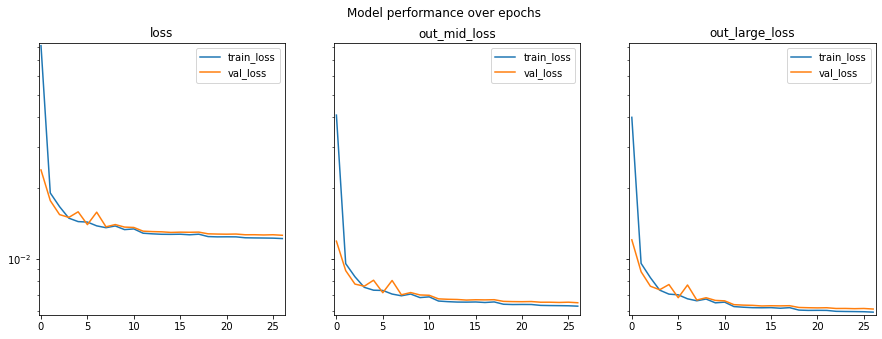

In [65]:
visualize_perf(history_v10)

Now I will show an example of the prediction in the test dataset

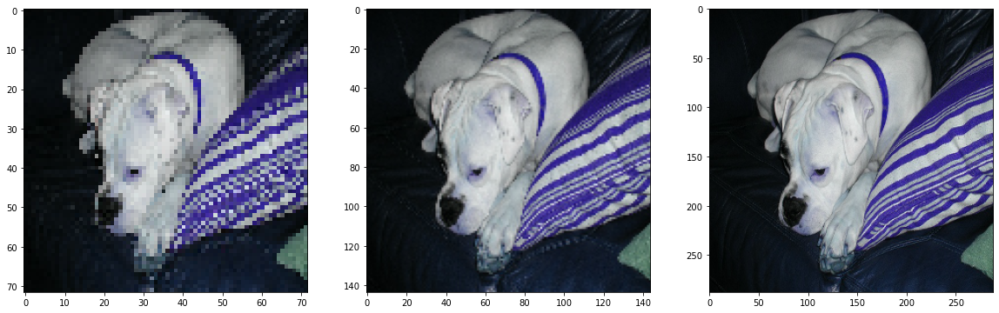

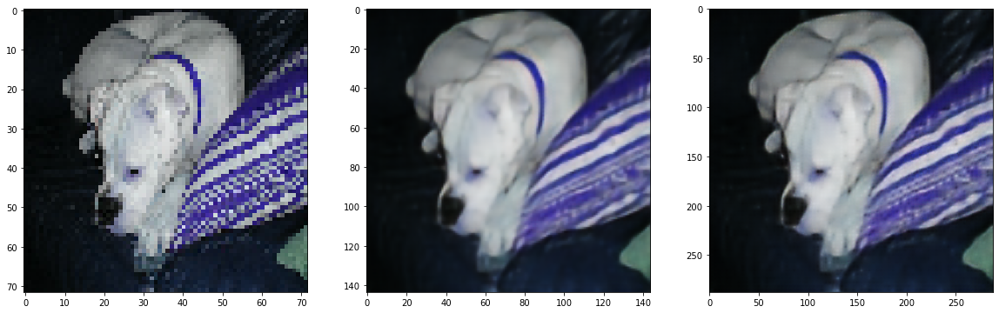

In [66]:
preds_v10 = model_v10.predict(test['X'])
plot_multiple_images(10, test['X'], test['y_mid'], test['y_large'])
plot_multiple_images(10, test['X'], preds_v10[0], preds_v10[1])

We can see that now the outline of the dog and the pattern of the pillow are very sharp

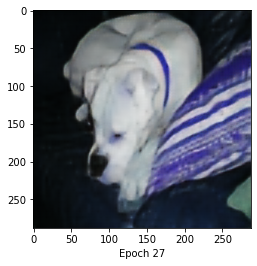

In [127]:
anim = create_animation(save_progress_cb_10.preds_container, 10)
anim

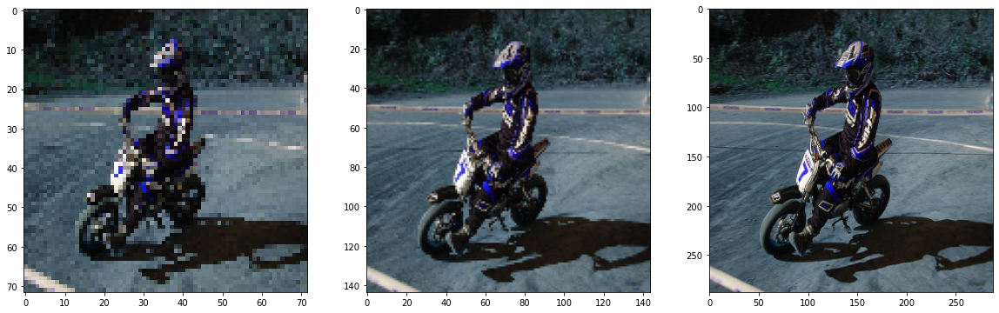

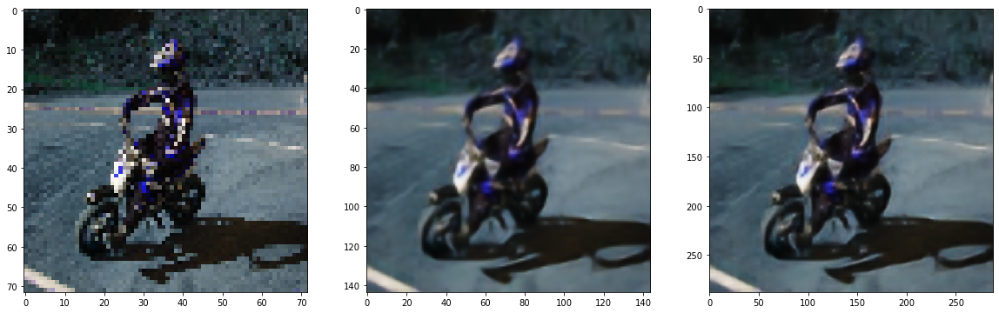

In [134]:
pred = model_v10.predict(test['X'])
plot_multiple_images(0, test['X'], test['y_mid'], test['y_large'])
plot_multiple_images(0, test['X'], pred[0], pred[1])

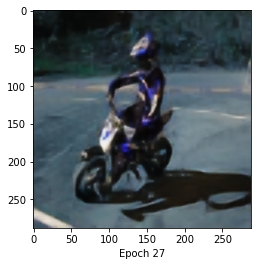

In [131]:
anim = create_animation(save_progress_cb_10.preds_container, 0)
anim

### Comparison infrastructure

In [168]:
def plot_compare_imgs(image_ind, stage=2):
    stage_ind = stage-1
    
    fig, ax = plt.subplots(3, 3, figsize=(15,15))
    fig.subplots_adjust(hspace=0.1, wspace=0.1)
    fig.suptitle(f'Comaparing predictions of stage {"large" if stage_ind else "mid"}', fontsize=24)
    
    
    def plot_img(ax, img, name):
        ax.axis('off')
        ax.imshow(img)
        ax.set_title(name)
    
    
    plot_img(ax[0,0], preds_v6[stage_ind][image_ind], 'Pretrained Network')
    plot_img(ax[0,1], preds_v10[stage_ind][image_ind], 'Final Version')
    plot_img(ax[0,2], preds_v7[stage_ind][image_ind], 'Depth to Space')
    plot_img(ax[1,0], preds_v4[stage_ind][image_ind], 'Residual Block')

    plot_img(ax[1,2], preds_v5[stage_ind][image_ind], 'Dilation Convolution')
    plot_img(ax[2,1], preds_v3[stage_ind][image_ind], 'Base Dual Output')
    
    if stage_ind:
        fig.delaxes(ax[2,0])
        fig.delaxes(ax[2,2])
    else:
        plot_img(ax[2,0], preds_v1[image_ind], 'Nearest UpSampling')
        plot_img(ax[2,2], preds_v2[image_ind], 'Bilinear UpSampling')
    
    real_img = test['y_large'][image_ind] if stage_ind else test['y_mid'][image_ind]
    plot_img(ax[1,1], real_img, 'Ground Truth')

In [213]:
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.image import psnr

def get_metrics_dataframe(stage=2):
    
    stage_ind = stage - 1
    tests = [test['y_mid'], test['y_large']]
    names = [f'v{i}' for i in range(1+2*stage_ind,8)] + ['v10']



    def mse_batch(y_pred, y_true):
        MSE = MeanSquaredError(tf.keras.losses.Reduction.NONE)
        return MSE(y_pred, y_true).numpy().mean(axis=1).mean(axis=1)

    mses = {name: mse_batch(eval('preds_'+name)[stage_ind], tests[stage_ind]) for name in names}
    psnrs = {name: psnr(eval('preds_'+name)[stage_ind], tests[stage_ind], max_val=1).numpy() for name in names}

    df_mse = pd.DataFrame(mses)
    df_mse['Type'] = 'MSE'
    df_mse['Image'] = df_mse.index + 1

    df_psnr = pd.DataFrame(psnrs)
    df_psnr['Type'] = 'PSNR'
    df_psnr['Image'] = df_mse.index + 1


    return pd.concat([df_mse, df_psnr])

In [266]:
def plot_compare_metrics(metric='MSE', stage=2):
    stage_ind = stage-1
    
    fig, ax = plt.subplots(3, 3, figsize=(12,12), sharey=True)
    fig.subplots_adjust(hspace=0.3, wspace=0.3)
    fig.suptitle(f'Comaparing {metric} of stage {"large" if stage_ind else "mid"}', fontsize=24)
    
    df_metrics = get_metrics_dataframe(stage)
    def plot_img(ax, model, name):
        if model:
            sns.scatterplot(data=df_metrics.query(f'Type == "{metric}"'), x='Image', y=model, ax=ax)
            ax.set_xlabel('images')
            ax.set_xticks(range(1,12))
        else:
            mean_metric = df_metrics.query(f'Type == "{metric}"').mean().drop('Image')
            sns.scatterplot(x=mean_metric.index, y=mean_metric.values, ax=ax)
            ax.set_xlabel('models')

        ax.set_ylabel('')
        ax.set_title(name)
    
    
    plot_img(ax[0,0], 'v6', 'Pretrained Network')
    plot_img(ax[0,1], 'v10', 'Final Version')
    plot_img(ax[0,2], 'v7', 'Depth to Space')
    plot_img(ax[1,0], 'v4', 'Residual Block')
    plot_img(ax[1,2], 'v5', 'Dilation Convolution')
    plot_img(ax[2,1], 'v3', 'Base Dual Output')
    
    if stage_ind:
        fig.delaxes(ax[2,0])
        fig.delaxes(ax[2,2])
    else:
        plot_img(ax[2,0], 'v1', 'Nearest UpSampling')
        plot_img(ax[2,2], 'v2', 'Bilinear UpSampling')
    
    plot_img(ax[1,1], None, 'Average')

# Final Report & Model Comparisons

In this work I tried various architectures in order to create a super resolution model. Now I will compare between the results of my models, both visually and numerically.

### MSE comparison

##### Stage 1

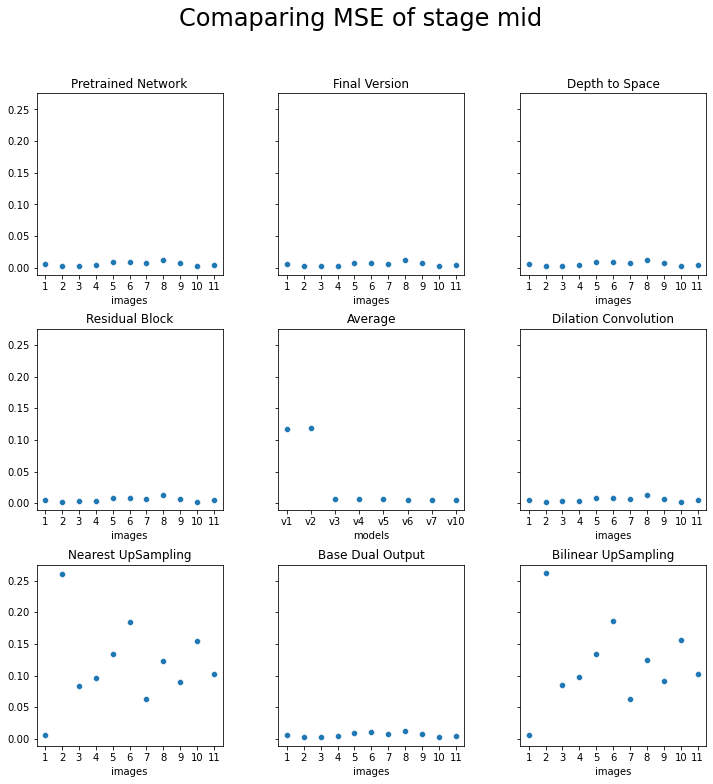

In [267]:
plot_compare_metrics('MSE', stage=1)

##### Stage 2

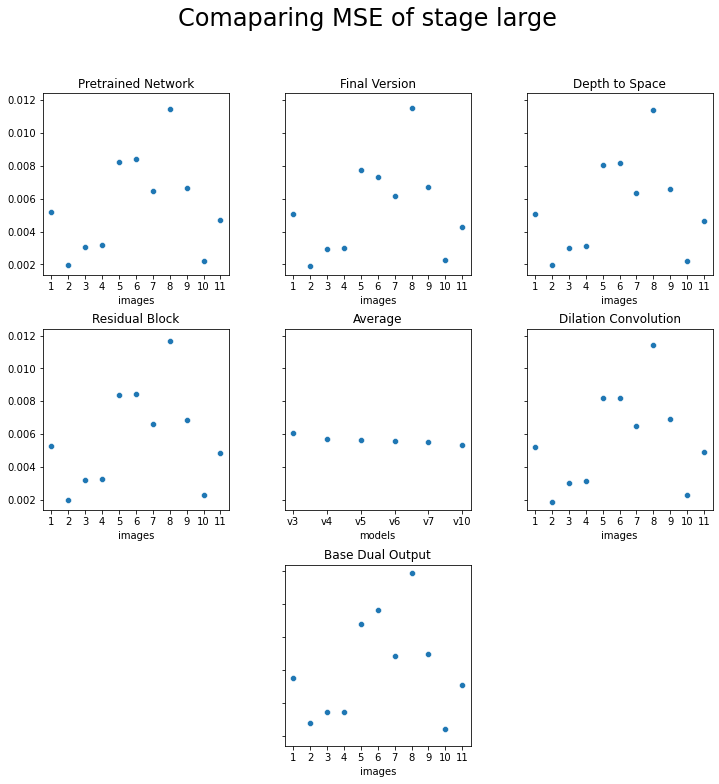

In [268]:
plot_compare_metrics('MSE', stage=2)

We can observe that the MSE were very high in the early stages and the `Final Version` is indeed the best by this metric

### PSNR comparison

##### Stage 1

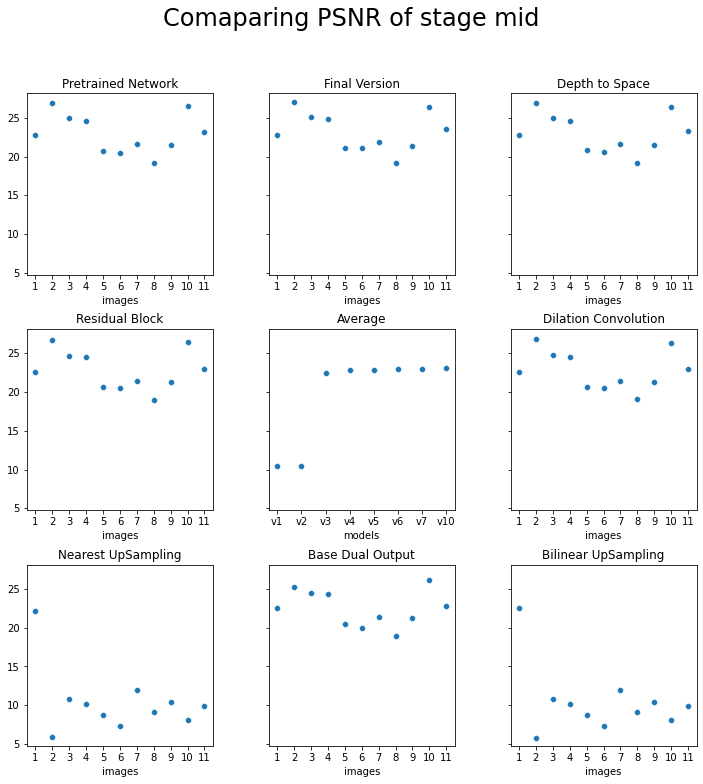

In [269]:
plot_compare_metrics('PSNR', stage=1)

##### Stage 2

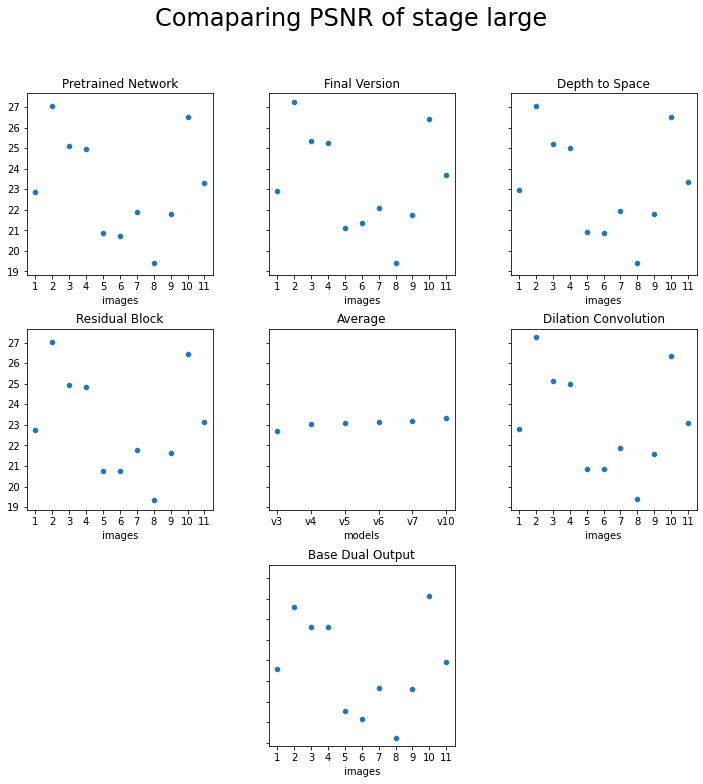

In [270]:
plot_compare_metrics('PSNR', stage=2)

We can observe that the PSNR does not change dramatically and the `Final Version` is indeed the best by this metric but he had problem with image 8, we will observe this later

### Visual comparison

##### Stage 1

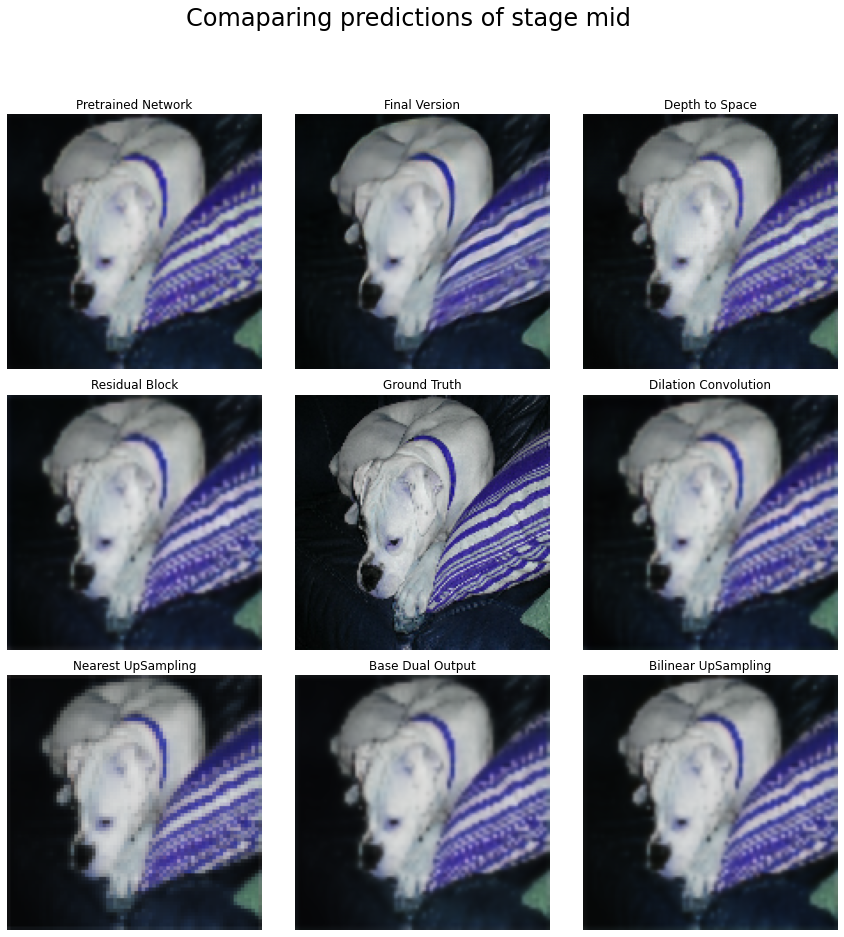

In [271]:
plot_compare_imgs(10, stage=1)

##### Stage 2

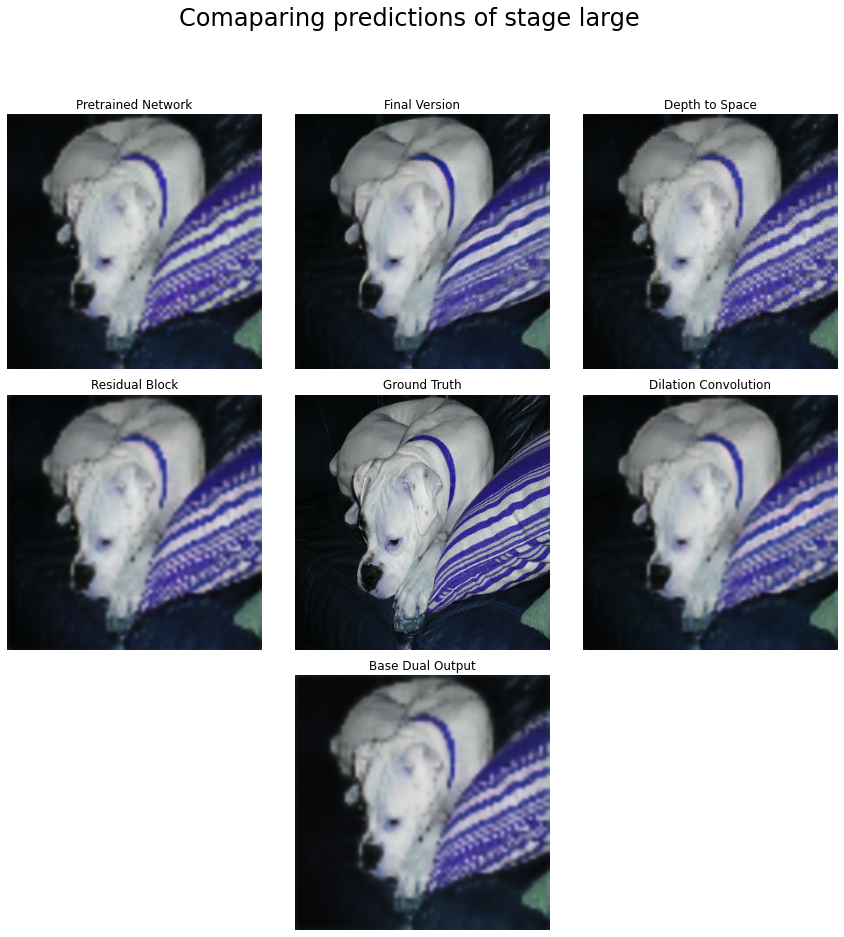

In [272]:
plot_compare_imgs(10, stage=2)

##### Stage 1

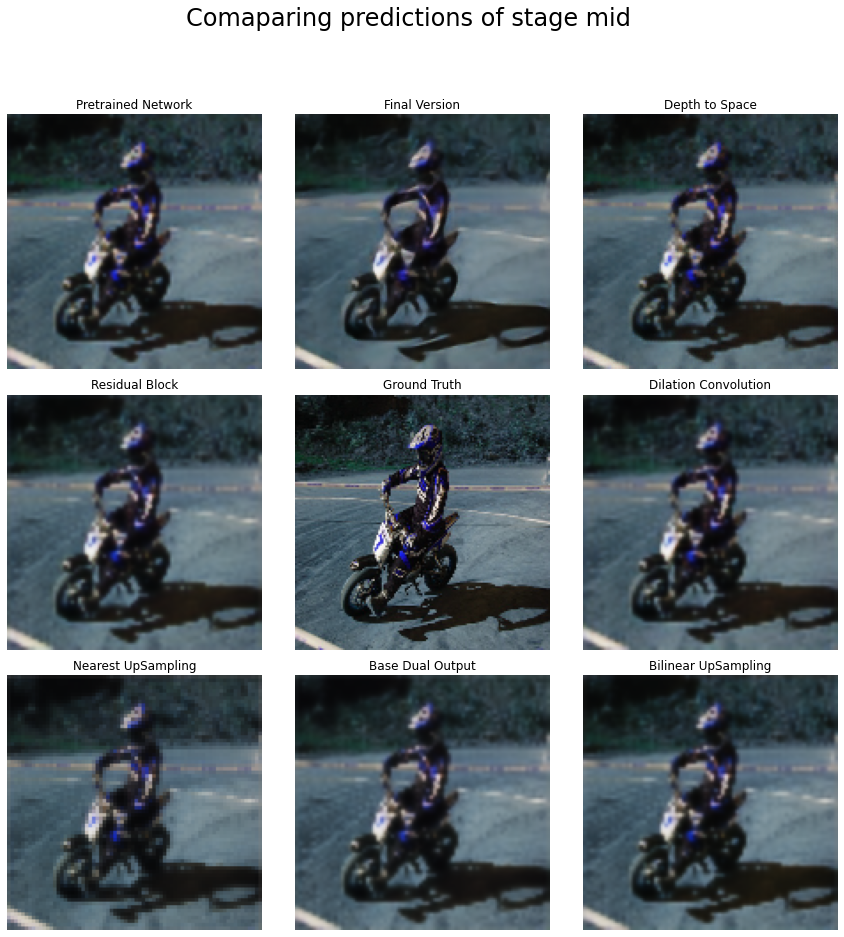

In [273]:
plot_compare_imgs(0, stage=1)

##### Stage 2

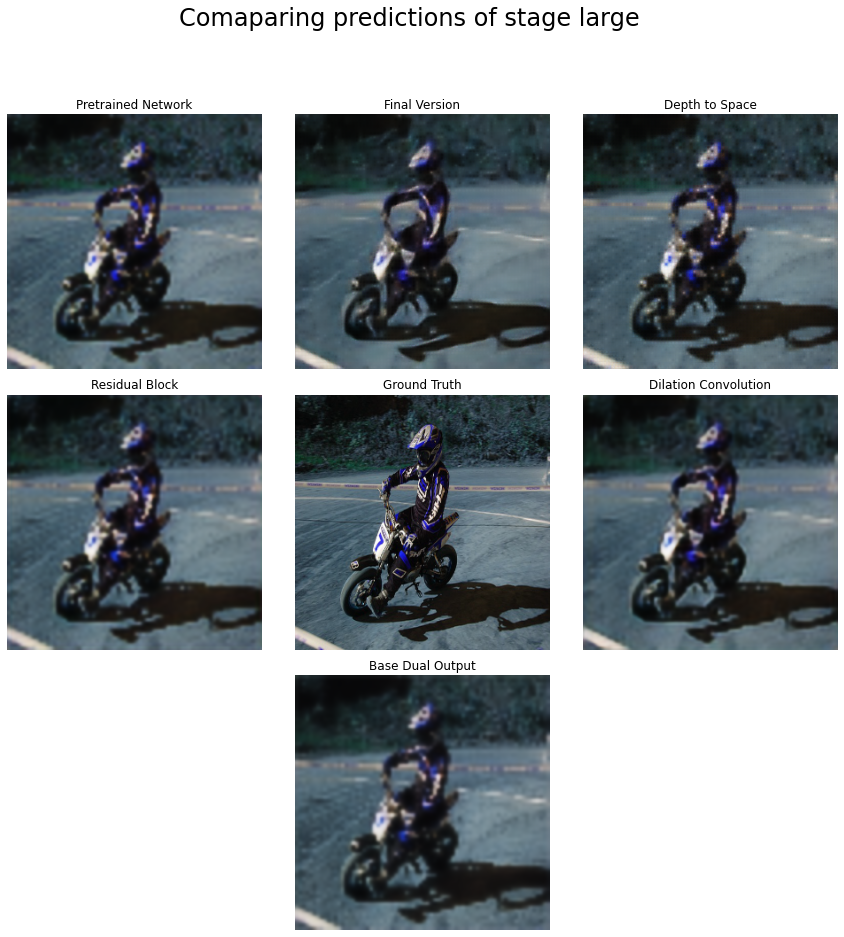

In [274]:
plot_compare_imgs(0, stage=2)

We can see visually that the `Final Version` did the best of them all. The outlines of the objects are very sharp.

Lets see what is image 8

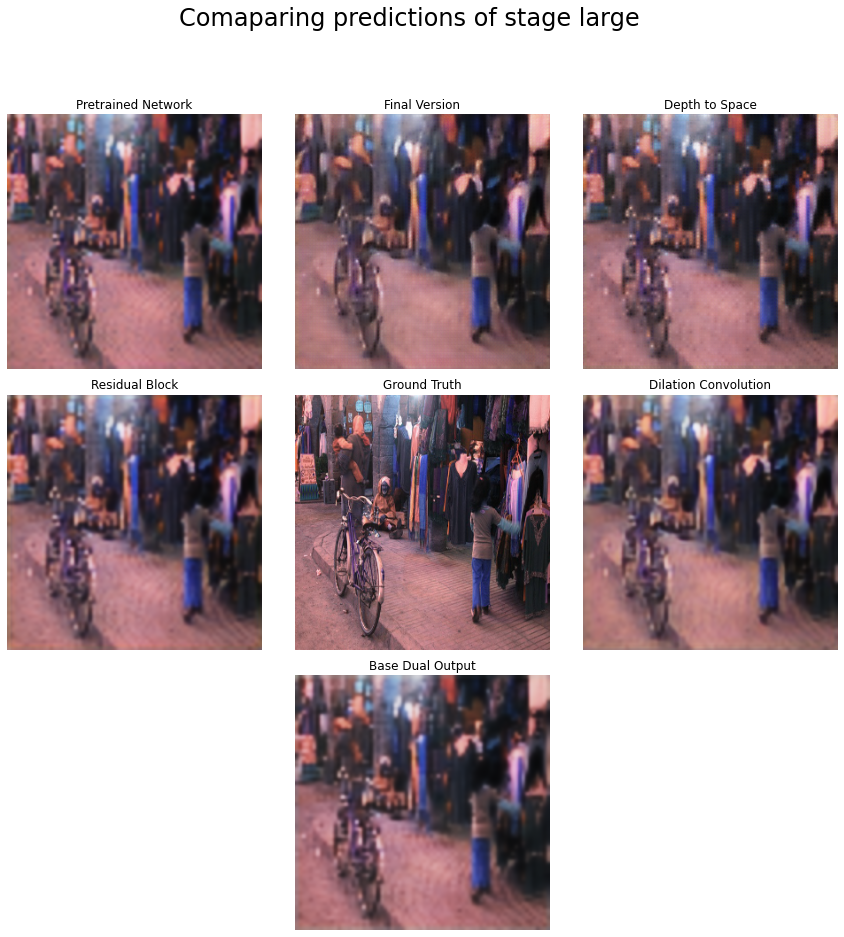

In [276]:
plot_compare_imgs(8, stage=2)

Image number 8 is very difficult and have a lot of objects in it, but even here the `Final Version` did the best of them all.

### Conclusions

In this work I tried to do my best super-resolution model. I am very satisfied by the results of my last version of the model as I was able to make the image very sharp.
I learned alot in the process of making this model. It was an iterative process and in each step I learned a new way of extracting features from images. In addition, I learned that the amount of samples in the training set do not always make the model better but it make it converge faster.

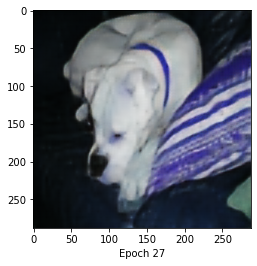

In [127]:
Bye bye doggy, you were the best!